In [1]:
#import dicom
import pydicom as dc
import os
import numpy as np
import matplotlib as plt
import natsort as ns
import cv2
#print(cv2.__version__)
#%pylab inline
#import imutils
#import scipy
from scipy import ndimage
from matplotlib import pyplot
import imutils

In [2]:
# Use os to get list of filepaths:

dataDir = r'C:\\DICOM'

fpaths = []  # create an empty list of all DICOM file paths

for dirName, subdirList, fileList in os.walk(dataDir):
    for filename in fileList:
        if ".dcm" in filename.lower():  # check for DICOM files only
            fpaths.append(os.path.join(dirName,filename))
            
#len(fpaths) # =22 (OK)

# Since ordering is 3-1, 3-10, 3-11, ... 
# use natsort to sort in natural way:
fpaths = ns.natsorted(fpaths)

In [3]:
# Try reading in a file:
frame = dc.read_file(fpaths[11])
#frame = dc.read_file(fpaths[11], dtype=np.int8)


#someData
frame.pixel_array

array([[15,  9, 10, ..., 25, 19, 21],
       [ 2, 10, 16, ..., 18, 26, 20],
       [ 7, 16, 13, ..., 15, 30, 23],
       ...,
       [ 5,  6,  6, ..., 47, 45, 38],
       [17, 10,  6, ..., 46, 45, 38],
       [17,  4,  9, ..., 55, 37, 42]], dtype=uint16)

# Plot data:
pyplot.figure(dpi=300)
pyplot.axes().set_aspect('equal', 'datalim')
pyplot.set_cmap(pyplot.gray())
#pyplot.pcolormesh(someData.pixel_array);
pyplot.pcolormesh(np.fliplr(np.flipud(frame.pixel_array)));

In [4]:
# Now load in all images and store in 3D numpy array:

# Need to create an empty array so need dims:

# The 3D array will have dims Columns x Rows x Slices (X x Y x Z):
"""
frame.Columns  =384
frame.Rows  =384
"""
dimX = frame.Columns
dimY = frame.Rows
dimZ = len(fpaths)

print('Pixel dims = ', dimX , 'x', dimY, 'x', dimZ, '\n')

# To display the images in the correct physiological scalings, 
# need to know the pixel spacing (dpix) along x, y and z:
"""
frame.PixelSpacing  = ['0.625', '0.625'] <-- strings
frame.SliceThickness  = '4' <-- string
"""
dpixY = float(frame.PixelSpacing[0])
dpixX = float(frame.PixelSpacing[1])
dpixZ = float(frame.SliceThickness)

print('Pixel spacing = ', dpixX , 'x', dpixY, 'x', dpixZ, '\n')

# Create empty 3D array using same datatype as pixel_array:
framesOrig = np.zeros((dimY, dimX, dimZ), dtype=frame.pixel_array.dtype)

#data.shape # = (384, 384, 22)

# Create x, y and z axes for plotting:
x = np.arange(0.0, dimX*dpixX, dpixX)
y = np.arange(0.0, dimY*dpixY, dpixY)
z = np.arange(0.0, dimZ*dpixZ, dpixZ)

print('Axes lengths = ', x.shape , 'x', y.shape, 'x', z.shape, '\n')

# Load image data into data array by looping through each slice:
for f in range(dimZ):
    frame = dc.read_file(fpaths[f])
    #frame = np.fliplr(np.flipud(frame)) # fliplf and flipup
    
    framesOrig[:, :, f] = frame.pixel_array # store in array
    
framesOrig = np.fliplr(np.flipud(framesOrig)) # fliplf and flipup

print('framesOrig.shape = ', framesOrig.shape, '\n')

Pixel dims =  384 x 384 x 22 

Pixel spacing =  0.625 x 0.625 x 4.0 

Axes lengths =  (384,) x (384,) x (22,) 

framesOrig.shape =  (384, 384, 22) 



# Display all frames:

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'6', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(dpi=300)

for f in range(dimZ):
    frame = data[:,:,f]

    ax = pyplot.subplot(5,5,1+f, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title(str(1+f), **title_font)
    
    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

In [7]:
# Normalise the pixel values to 255 to convert to uint8:

# Create empty 3D array using same datatype as pixel_array:
frames = np.zeros((dimY, dimX, dimZ), dtype='uint8')

framesOrigMaxVal = np.max(framesOrig[:,:,:])

for f in range(dimZ):
    frameOrig = framesOrig[:,:,f]
    
    #frame = frameOrig/framesOrigMaxVal
    frame = np.uint8(255.0*frameOrig/framesOrigMaxVal)
    
    frames[:,:,f] = frame

In [8]:
print(framesOrigMaxVal)
print(np.max(frames[:,:,:]))

1568
255


In [9]:
frameOrig

array([[39, 42, 40, ...,  5, 21, 25],
       [39, 37, 27, ...,  7, 13, 12],
       [30, 36, 29, ...,  2,  9, 18],
       ...,
       [17, 11, 11, ...,  9, 11,  8],
       [12, 13, 17, ..., 10,  7, 13],
       [ 8, 15, 24, ...,  7, 15, 11]], dtype=uint16)

In [10]:
frame

array([[6, 6, 6, ..., 0, 3, 4],
       [6, 6, 4, ..., 1, 2, 1],
       [4, 5, 4, ..., 0, 1, 2],
       ...,
       [2, 1, 1, ..., 1, 1, 1],
       [1, 2, 2, ..., 1, 1, 2],
       [1, 2, 3, ..., 1, 2, 1]], dtype=uint8)

In [11]:
frame.dtype

dtype('uint8')

# Add blurring to Normalise the pixel values to 255:

blurKernel = 3
#blurKernel = 5
#blurKernel = 7


# Create empty 3D array using same datatype as pixel_array:
dataNormBlurred = np.zeros((dimY, dimX, dimZ), dtype='uint8')

#dataMaxVal = np.max(data[:,:,:])

for f in range(dimZ):
    frame = dataNorm[:,:,f]
    
    frameBlurred = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0)
    
    #frameNorm = frame/dataMaxVal
    #frameNorm = 255.0*frame/dataMaxVal
    #frameNorm = np.uint8(frameNorm)
    
    dataNormBlurred[:,:,f] = frameBlurred

dataNormBlurred.dtype

np.max(dataNormBlurred[:,:,:])

# Plot result of unit8 conversion:

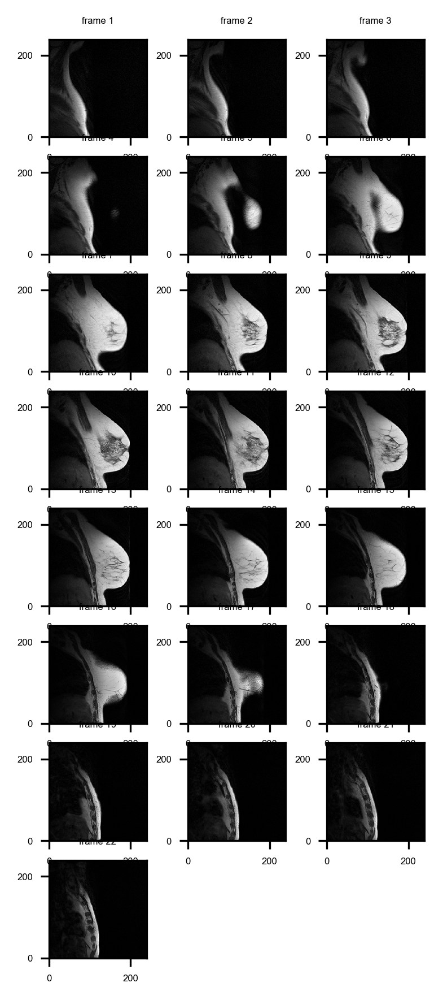

In [13]:
# Plot result of unit8 conversion:


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

for f in range(dimZ):
    frame = frames[:,:,f]
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,3,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.set_cmap(pyplot.gray())
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

# Instead of using cv.threshold, use for loops and different thresholds:

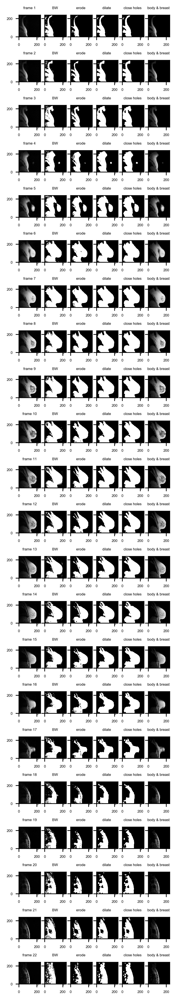

In [38]:


# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:

ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

thresh_body = 0.15 # = 15%
thresh_breast = 0.40 # = 40%

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')
backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 6

for f in range(dimZ):
    frame = frames[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    thresh = avePixVal*thresh_background
    #thresh = InvAvePixVal*thresh_background
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')
    
    #mask = cv2.threshold(frame, thresh, 255, cv2.THRESH_BINARY)[1]
    #mask = cv2.threshold(frameInv, thresh, 255, cv2.THRESH_BINARY)[1]

    # Take inverse of mask:
    #mask = 255 - mask
    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

        
      
    # Erode:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    mask = cv2.erode(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
            
            
    
    # Close holes:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        

    # Convert mask to binary:
    bodyAndBreastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

    # Background mask is the logical compliment of bodyAndBreastMask:
    backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    bodyAndBreastMasks[:,:,f] = bodyAndBreastMask
    backgroundMasks[:,:,f] = backgroundMask

    # Show result of bodyAndBreastMask:
    bodyAndBreast = bodyAndBreastMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('body & breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)


# Try to improve on above by closing holes after BW and before eroding:

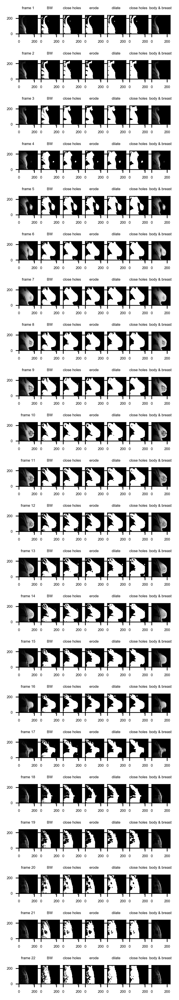

In [73]:
# Try to improve on above by closing holes after BW and before eroding:

# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:

ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

thresh_body = 0.15 # = 15%
thresh_breast = 0.40 # = 40%

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel15 = np.ones((15,15),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')
backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 7

for f in range(dimZ):
    frame = frames[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    thresh = avePixVal*thresh_background
    #thresh = InvAvePixVal*thresh_background
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')
    
    #mask = cv2.threshold(frame, thresh, 255, cv2.THRESH_BINARY)[1]
    #mask = cv2.threshold(frameInv, thresh, 255, cv2.THRESH_BINARY)[1]

    # Take inverse of mask:
    #mask = 255 - mask
    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    # Close holes before eroding:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) # introduces many artefacts
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel15) # introduces many artefacts
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) # still artefacts
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
      
    
    # Erode:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    mask = cv2.erode(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
            
            
    
    # Close holes:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        

    # Convert mask to binary:
    bodyAndBreastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

    # Background mask is the logical compliment of bodyAndBreastMask:
    backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    bodyAndBreastMasks[:,:,f] = bodyAndBreastMask
    backgroundMasks[:,:,f] = backgroundMask

    # Show result of bodyAndBreastMask:
    bodyAndBreast = bodyAndBreastMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('body & breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)


In [ ]:
"""
Trying to close holes after BW and before eroding is not very helpful. Even with a large
blur kernel it doesn't completely close large holes, and even fairly moderate kernel
sizes introduces artefacts.
"""

# This time try to close the large holes by looking at the black pixels and turning them to white if the position of the black pixel is left of the right-most white pixel at that row (y):

In [75]:
mask

array([[255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

In [78]:
mask[0,:]

array([255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 25

In [80]:
np.where(mask[0,:]==255)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175, 176, 177

In [84]:
np.where(mask[0,:]==255)[0][-1]


199

IndexError: index -1 is out of bounds for axis 0 with size 0

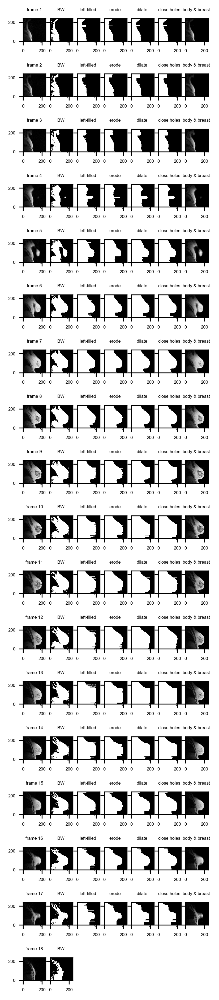

In [86]:
# This time try to close the large holes by looking at the black pixels 
# and turning them to white if the position of the black pixel is left 
# of the right-most white pixel at that row (y):


# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:

ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

thresh_body = 0.15 # = 15%
thresh_breast = 0.40 # = 40%

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel15 = np.ones((15,15),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')
backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 7

for f in range(dimZ):
    frame = frames[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    thresh = avePixVal*thresh_background
    #thresh = InvAvePixVal*thresh_background
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')
    
    #mask = cv2.threshold(frame, thresh, 255, cv2.THRESH_BINARY)[1]
    #mask = cv2.threshold(frameInv, thresh, 255, cv2.THRESH_BINARY)[1]

    # Take inverse of mask:
    #mask = 255 - mask
    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    # Close holes before eroding by turning black pixels white if
    # they are left of the right-most white pixel at that same
    # row (y):
    for r in range(dimY):
        # Find the index of the right-most white pixel for this row:
        ind = np.where(mask[r,:]==255)[0][-1]
        for c in range(dimX):
            if c < ind: # the pixel is left of ind
                mask[r,c] = 255
    

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('left-filled ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
      
    
    # Erode:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    mask = cv2.erode(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
            
            
    
    # Close holes:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        

    # Convert mask to binary:
    bodyAndBreastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

    # Background mask is the logical compliment of bodyAndBreastMask:
    backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    bodyAndBreastMasks[:,:,f] = bodyAndBreastMask
    backgroundMasks[:,:,f] = backgroundMask

    # Show result of bodyAndBreastMask:
    bodyAndBreast = bodyAndBreastMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('body & breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)




# Tweak above. Rather than turning black pix to white if left of the right-most pix, do so if left of the centre-of-mass of the mask averaged for all rows:

In [91]:
inds = np.where(mask[0,:]==255)[0]
inds

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [90]:
inds[0], inds[-1]

(0, 206)

In [95]:
int(np.average([inds[0], inds[-1]]))

103

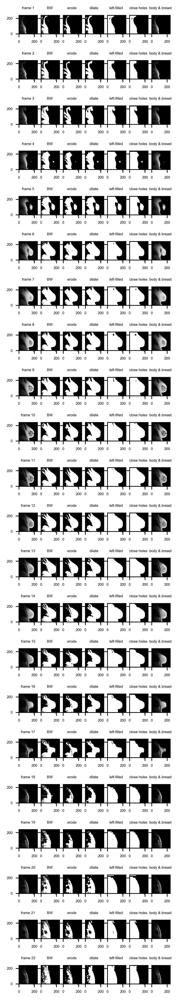

In [111]:
# This time try to close the large holes by looking at the black pixels 
# and turning them to white if the position of the black pixel is left 
# of the centre-of-mass of the the mask averaged for all rows:


# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:

ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

thresh_body = 0.15 # = 15%
thresh_breast = 0.40 # = 40%

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel15 = np.ones((15,15),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
bodyAndBreastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')
backgroundMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 7

for f in range(dimZ):
    frame = frames[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    thresh = avePixVal*thresh_background
    #thresh = InvAvePixVal*thresh_background
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')
    
    #mask = cv2.threshold(frame, thresh, 255, cv2.THRESH_BINARY)[1]
    #mask = cv2.threshold(frameInv, thresh, 255, cv2.THRESH_BINARY)[1]

    # Take inverse of mask:
    #mask = 255 - mask
    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    # Erode before left-filling:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    mask = cv2.erode(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        
    # Left-fill holes by turning black pixels white if they are
    # left of the right-most white pixel at that same row (y):
    for r in range(dimY):
        # Find the indexes of the white pixels for this row:
        inds = np.where(mask[r,:]==255)[0] # this will return [] if no white pixels!
        
        if inds.size > 0: # if inds not []
            # Find the centre-of-mass:
            com = int(np.average([inds[0], inds[-1]]))

            for c in range(dimX):
                if c < com: # the pixel is left of com
                    mask[r,c] = 255
       
    

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('left-filled ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
      

    # Close holes left behind after left-filling for cases 
    # where ind=[]:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    if 0:
        # Erode:
        #out = cv2.erode(out, Kernel3, iterations = 5) 
        #mask = cv2.erode(mask, Kernel3, iterations = 3)
        #mask = cv2.erode(mask, Kernel2, iterations = 3)
        #mask = cv2.erode(mask, Kernel2, iterations = 7)
        #mask = cv2.erode(mask, Kernel2, iterations = 10)
        #mask = cv2.erode(mask, Kernel2, iterations = 15)
        #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
        #mask = cv2.erode(mask, Kernel2, iterations = 30)
        #mask = cv2.erode(mask, Kernel3, iterations = 5)
        #mask = cv2.erode(mask, Kernel2, iterations = 3)
        mask = cv2.erode(mask, Kernel3, iterations = 3)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('erode ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)


        
        
        

    # Convert mask to binary:
    bodyAndBreastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

    # Background mask is the logical compliment of bodyAndBreastMask:
    backgroundMask = np.logical_not(bodyAndBreastMask)

    # Store masks in 3D arrays:
    bodyAndBreastMasks[:,:,f] = bodyAndBreastMask
    backgroundMasks[:,:,f] = backgroundMask

    # Show result of bodyAndBreastMask:
    bodyAndBreast = bodyAndBreastMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('body & breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)




In [ ]:
"""
The results are quite ok but for some reason it's flattening out the breast in some frames.
It's as if the algorithm is top-filling (filling upwards) rather than left-filling (filling
downwards). I can't see why it would be doing this.
"""

In [109]:
r, c

(379, 383)

In [110]:
inds

array([], dtype=int64)

In [103]:
if inds.size > 0:
    print('true')

In [619]:
avePixVal

18.450101910215437

In [620]:
maxPixVal

255

In [621]:
thresh

14.76008152817235

# Similar to above but now try to isolate the breast only:

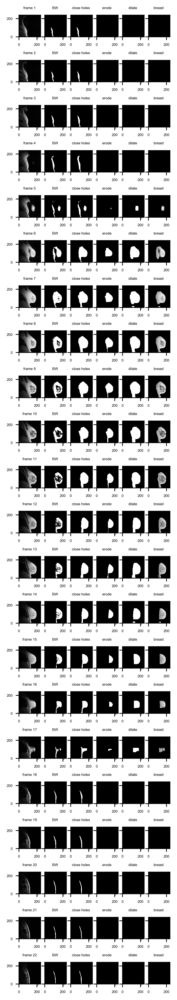

In [40]:
 """ 
 This is very difficult without either leaving out significant breast and/or
 leaving in significant body (ribs).
 
 I think I need to start by using bodyAndBreastsMasks to remove the background.
 Then select an appropriate threshold and use it to find all pixels < thresh
 that relate to the body and not the breast.
 It might be useful to threshold at a value that is a % of the ave pix value
 in the result of removing the background.
 """
    
# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:
ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0

# Try different thresholds for body, breast and background
# using max pix value (maxPixVal) in each frame or
# using max pix value across all frames:
max_all_frames = 0 # use max on frame-by-frame basis
#max_all_frames = 1 # use max across all frames 

maxPixVal = np.max(frames[:,:,:]) 
    
    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

#thresh_body = 0.15 # = 15%

# A threshold value of 40% of avePixVal was useful for isolating the body+breast from
# the background.  Now try to determine a suitable threshold value as a % of maxPixVal
# that isolates the breast from the body:
thresh_breast = 0.8 # = 80% of maxPixVal (too high)
thresh_breast = 0.7 # = 70% of maxPixVal (too high)
#thresh_breast = 0.5 # = 50% of maxPixVal (too high)
#thresh_breast = 0.25 # = 20% of maxPixVal (ok-ish when using maxPixVal for all frames)
thresh_breast = 0.6 # = 60%

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
breastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 6

for f in range(dimZ):
    frame = frames[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    if not max_all_frames:
        maxPixVal = np.max(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    #thresh = avePixVal*thresh_background
    ##thresh = InvAvePixVal*thresh_background
    thresh = maxPixVal*thresh_breast
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')

    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Close holes:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel50) 

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        

      
    # Erode:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 10)
    #mask = cv2.erode(mask, Kernel3, iterations = 20)
    mask = cv2.erode(mask, Kernel3, iterations = 15)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 15)
    mask = cv2.dilate(mask, Kernel3, iterations = 20)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
            
            
    if 0:
        # Close holes:
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
        
        

    if 1:
        # Convert mask to binary:
        breastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

        # Background mask is the logical compliment of bodyAndBreastMask:
        #backgroundMask = np.logical_not(bodyAndBreastMask)

        # Store masks in 3D arrays:
        breastMasks[:,:,f] = breastMask
        #backgroundMasks[:,:,f] = backgroundMask

        # Show result of breastMask:
        breast = breastMask*frame

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, breast);
        pyplot.title('breast ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)


# Isolating the breast was difficult. This time blur the image first (might help reduce holes due to dark blood vessels):

In [46]:
# Blur frames:
blurKernel = 3
blurKernel = 5 # this is decent (preserves breast in frame 4)
#blurKernel = 7 # too high (artifact in frame 4 above breast)

# Create empty 3D array for framesBlurred:
framesBlurred = np.zeros((dimY, dimX, dimZ), dtype='uint8')

for f in range(dimZ):
    frame = frames[:,:,f]
    
    frameBlurred = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0)

    framesBlurred[:,:,f] = frameBlurred

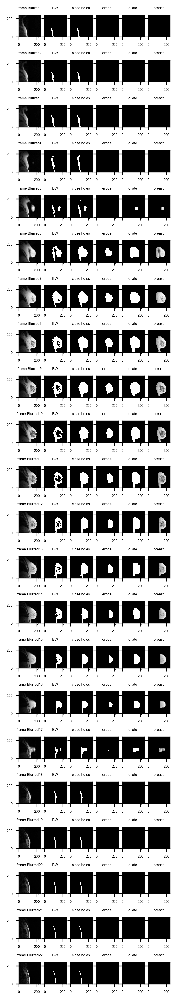

In [52]:
 """ 
 This is very difficult without either leaving out significant breast and/or
 leaving in significant body (ribs).
 
 I think I need to start by using bodyAndBreastsMasks to remove the background.
 Then select an appropriate threshold and use it to find all pixels < thresh
 that relate to the body and not the breast.
 It might be useful to threshold at a value that is a % of the ave pix value
 in the result of removing the background.
 
 Isolating the breast was difficult. This time blur the image first 
 (might help reduce holes due to dark blood vessels).
 """

""" It does seem to perform a bit better - see frame 4 - the breast is preserved """
    

# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:
ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

#avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0
avePixVal = np.average(framesBlurred[:,:,:]) # this will be updated if ave_all_frames = 0

# Try different thresholds for body, breast and background
# using max pix value (maxPixVal) in each frame or
# using max pix value across all frames:
max_all_frames = 0 # use max on frame-by-frame basis
#max_all_frames = 1 # use max across all frames 

#maxPixVal = np.max(frames[:,:,:]) 
maxPixVal = np.max(framesBlurred[:,:,:])
    
    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

#thresh_body = 0.15 # = 15%

# A threshold value of 40% of avePixVal was useful for isolating the body+breast from
# the background.  Now try to determine a suitable threshold value as a % of maxPixVal
# that isolates the breast from the body:
thresh_breast = 0.8 # = 80% of maxPixVal (too high)
thresh_breast = 0.7 # = 70% of maxPixVal (too high)
#thresh_breast = 0.5 # = 50% of maxPixVal (too high)
#thresh_breast = 0.25 # = 20% of maxPixVal (ok-ish when using maxPixVal for all frames)
thresh_breast = 0.6 # = 60% (seems suitable for non-blurred and blurred images)
#thresh_breast = 0.5 # not better than 0.6 for blurred images
#thresh_breast = 0.55 # not better than 0.6 for blurred images

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
breastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 6

for f in range(dimZ):
    frame = frames[:,:,f]
    frame = framesBlurred[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    if not max_all_frames:
        maxPixVal = np.max(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frameBlurred);
    pyplot.title('frame Blurred ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the body and breast using thresh_background: """
    
    # Convert to B&W using thresh:
    #thresh = avePixVal*thresh_background
    ##thresh = InvAvePixVal*thresh_background
    thresh = maxPixVal*thresh_breast
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')

    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Close holes:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel50) 

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        

      
    # Erode:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 10)
    #mask = cv2.erode(mask, Kernel3, iterations = 20)
    #mask = cv2.erode(mask, Kernel3, iterations = 15) # good compromise for un-blurred frames (max_all_frames = 0, thresh_breast = 0.6)
    mask = cv2.erode(mask, Kernel3, iterations = 17)# seems fine using blurred frames (max_all_frames = 0, thresh_breast = 0.6)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Dilate:
    #out = cv2.dilate(out, Kernel3, iterations = 7) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel2, iterations = 10)
    #mask = cv2.dilate(mask, Kernel3, iterations = 10)
    #mask = cv2.dilate(mask, Kernel5, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 3)
    #mask = cv2.dilate(mask, Kernel3, iterations = 15)
    mask = cv2.dilate(mask, Kernel3, iterations = 20)

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('dilate ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
            
            
    if 0:
        # Close holes:
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
        
        

    if 1:
        # Convert mask to binary:
        breastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

        # Background mask is the logical compliment of bodyAndBreastMask:
        #backgroundMask = np.logical_not(bodyAndBreastMask)

        # Store masks in 3D arrays:
        breastMasks[:,:,f] = breastMask
        #backgroundMasks[:,:,f] = backgroundMask

        # Show result of breastMask:
        breast = breastMask*frame

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, breast);
        pyplot.title('breast ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)


In [ ]:
""" So blurring did help a bit but try idea below before giving up """

# Either use a lower threshold to target the body within frame*bodyAndBreastMasks, to create bodyMasks for each frame; 
# or 
# use the mask within bodyAndBreastMasks with the smallest area to be a constant bodyMask (see below)...

# Create constant bodyMask (using bodyAndBreastMasks with min area):

In [41]:
# Instead of using np.min, use the mask that has the smallest area:

areas = []

for f in range(dimZ):
    mask = bodyAndBreastMasks[:,:,f]
    
    area = np.sum(mask)
    
    areas.append(area)

areas

[29294,
 34721,
 43219,
 47619,
 60491,
 71463,
 71959,
 71504,
 72210,
 71228,
 68564,
 65968,
 65689,
 61910,
 58403,
 55088,
 45980,
 33508,
 33820,
 37777,
 41173,
 38783]

In [42]:
# Find the index of the mask in bodyAndBreastMasks with the minimum area:

#maskMinInd = [mask in masks if areas==min(areas)]

bodyMaskInd = areas.index(min(areas))

bodyMask = bodyAndBreastMasks[:,:,bodyMaskInd]

print('index of min area = ', str(bodyMaskInd))

index of min area =  0


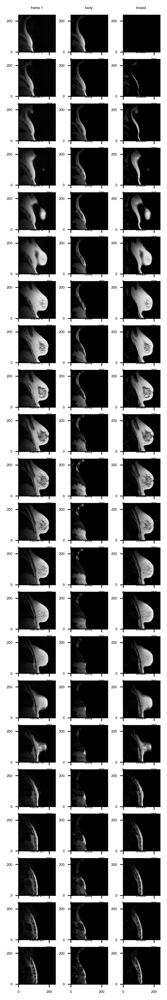

In [26]:
# Use bodyMask to try to isolate the bodyAndBreastMask:



# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot position

cols = 3

for f in range(dimZ):
    frame = frames[:,:,f]
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    """ Use dataMasksMin to isolate the body from body+breast """
    
    body = bodyMask*frame

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, body);
    pyplot.title('body ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

        
    """ Use bodyAndBreastMasks and bodyMask to isolate the breast from body+breast """
    
    #breastMask = dataMasks[:,:,f] - dataMasksMin
    breastMask = np.bitwise_xor(bodyAndBreastMasks[:,:,f], bodyMask)
    
    breast = breastMask*frame
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, breast);
    pyplot.title('breast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)


    if 0:
        i = i + 1

        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('dilate ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)



        i = i + 1

        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)

        # Convert mask to binary:
        #mask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

        #dataMasks[:,:,f] = mask


In [ ]:
""" The above result is not too bad but quite a lot of body (e.g. ribs) mistaken for breast """

In [ ]:
""" 
Next try creating bodyMasks for each frame using an appropriate threshold to be below 
starting with the images masked by bodyAndBreastMasks
"""

In [ ]:
""" 
The issue with trying to isolate the breast from body is that for frames where there is only
a small portion of breast the pix values are lower or similar to pixel values of the body.
So regardless of whether I threshold pixels above or below a value it will be tricky.

Another idea that came to mind is to blur the frames significantly such that the small
portion of breast in some frames is (hopefully) blurred away.  Then isolating the body
might be easier, to obtain bodyMasks. Then with breastAndBodyMasks and bodyMasks I can 
obtain breastMasks.
"""

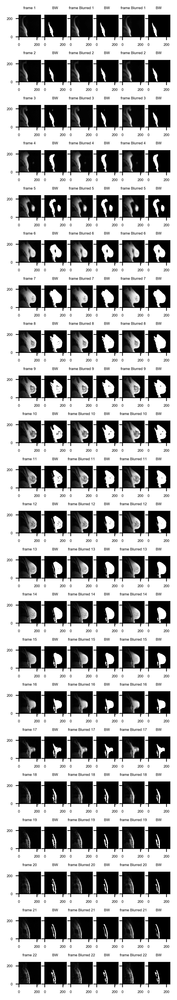

In [62]:
# Blur frames:
blurKernel = 3
blurKernel = 5 # this is decent (preserves breast in frame 4)
blurKernel = 7 # 
blurKernel = 20 # doesn't work
blurKernel = 15

if 0:
    # Create empty 3D array for framesBlurred:
    framesBlurred = np.zeros((dimY, dimX, dimZ), dtype='uint8')

    for f in range(dimZ):
        frame = frames[:,:,f]

        frameBlurred = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0)

        framesBlurred[:,:,f] = frameBlurred
    

    
# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:
ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

#avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0
avePixVal = np.average(framesBlurred[:,:,:]) # this will be updated if ave_all_frames = 0

# Try different thresholds for body, breast and background
# using max pix value (maxPixVal) in each frame or
# using max pix value across all frames:
max_all_frames = 0 # use max on frame-by-frame basis
#max_all_frames = 1 # use max across all frames 

#maxPixVal = np.max(frames[:,:,:]) 
maxPixVal = np.max(framesBlurred[:,:,:])
    
    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%

#thresh_body = 0.15 # = 15%

# A threshold value of 40% of avePixVal was useful for isolating the body+breast from
# the background.  Now try to determine a suitable threshold value as a % of maxPixVal
# that isolates the breast from the body:
thresh_breast = 0.8 # = 80% of maxPixVal (too high)
thresh_breast = 0.7 # = 70% of maxPixVal (too high)
#thresh_breast = 0.5 # = 50% of maxPixVal (too high)
#thresh_breast = 0.25 # = 20% of maxPixVal (ok-ish when using maxPixVal for all frames)
thresh_breast = 0.6 # = 60% (seems suitable for non-blurred and blurred images)
#thresh_breast = 0.5 # not better than 0.6 for blurred images
#thresh_breast = 0.55 # not better than 0.6 for blurred images
thresh_breast = 0.3

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyAndBreastMasks
# and backgroundMasks for each frame:
breastMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 6

for f in range(dimZ):
    frame = frames[:,:,f]
    #frameBlurred = framesBlurred[:,:,f]
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    if not max_all_frames:
        maxPixVal = np.max(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    """ First isolate the breast using thresh_breast for non-blurred frame: """
    # Convert to B&W using thresh:
    #thresh = avePixVal*thresh_background
    ##thresh = InvAvePixVal*thresh_background
    thresh = maxPixVal*thresh_breast

    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')


    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')

    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] > thresh:
                mask[r,c] = 255

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    # Blur frame once:
    frameBlurred = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0)
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frameBlurred);
    pyplot.title('frame Blurred ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
    
    """ Now isolate the breast using thresh_breast for blurred frame: """
    # Convert to B&W using thresh:
    #thresh = avePixVal*thresh_background
    ##thresh = InvAvePixVal*thresh_background
    thresh = maxPixVal*thresh_breast

    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')


    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')

    for r in range(dimY):
        for c in range(dimX):
            if frameBlurred[r,c] > thresh:
                mask[r,c] = 255

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    # Blur frame a second time:
    frameBlurred = cv2.GaussianBlur(frameBlurred, (blurKernel, blurKernel), 0)
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frameBlurred);
    pyplot.title('frame Blurred ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
    
    """ Now isolate the breast using thresh_breast for blurred frame: """
    # Convert to B&W using thresh:
    #thresh = avePixVal*thresh_background
    ##thresh = InvAvePixVal*thresh_background
    thresh = maxPixVal*thresh_breast

    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')


    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')

    for r in range(dimY):
        for c in range(dimX):
            if frameBlurred[r,c] > thresh:
                mask[r,c] = 255

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        
    if 0:
        """ First isolate the body and breast using thresh_breast: """
        # Convert to B&W using thresh:
        #thresh = avePixVal*thresh_background
        ##thresh = InvAvePixVal*thresh_background
        thresh = maxPixVal*thresh_breast

        #print('thresh_background = ', str(thresh_background))
        #print('avePixVal = ', str(avePixVal))
        #print('thresh = ', str(thresh), '\n')


        # Create empty array for mask:
        mask = np.zeros((dimY, dimX), dtype='uint8')

        for r in range(dimY):
            for c in range(dimX):
                if frame[r,c] > thresh:
                    mask[r,c] = 255

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('BW ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)



        # Close holes:
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel50) 

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)




        # Erode:
        #out = cv2.erode(out, Kernel3, iterations = 5) 
        #mask = cv2.erode(mask, Kernel3, iterations = 3)
        #mask = cv2.erode(mask, Kernel2, iterations = 3)
        #mask = cv2.erode(mask, Kernel2, iterations = 7)
        #mask = cv2.erode(mask, Kernel2, iterations = 10)
        #mask = cv2.erode(mask, Kernel2, iterations = 15)
        #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
        #mask = cv2.erode(mask, Kernel2, iterations = 30)
        #mask = cv2.erode(mask, Kernel3, iterations = 5)
        #mask = cv2.erode(mask, Kernel2, iterations = 3)
        #mask = cv2.erode(mask, Kernel3, iterations = 3)
        #mask = cv2.erode(mask, Kernel3, iterations = 10)
        #mask = cv2.erode(mask, Kernel3, iterations = 20)
        #mask = cv2.erode(mask, Kernel3, iterations = 15) # good compromise for un-blurred frames (max_all_frames = 0, thresh_breast = 0.6)
        mask = cv2.erode(mask, Kernel3, iterations = 17)# seems fine using blurred frames (max_all_frames = 0, thresh_breast = 0.6)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('erode ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)



        # Dilate:
        #out = cv2.dilate(out, Kernel3, iterations = 7) 
        #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
        #mask = cv2.dilate(mask, Kernel3, iterations = 10)
        #mask = cv2.dilate(mask, Kernel2, iterations = 10)
        #mask = cv2.dilate(mask, Kernel3, iterations = 10)
        #mask = cv2.dilate(mask, Kernel5, iterations = 3)
        #mask = cv2.dilate(mask, Kernel3, iterations = 3)
        #mask = cv2.dilate(mask, Kernel3, iterations = 15)
        mask = cv2.dilate(mask, Kernel3, iterations = 20)

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('dilate ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)


        if 0:
            # Close holes:
            #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
            #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
            #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
            #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
            mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

            i = i + 1
            ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
            pyplot.pcolormesh(x, y, mask);
            pyplot.title('close holes ', **title_font)

            # Set the tick labels font
            for label in (ax.get_xticklabels() + ax.get_yticklabels()):
                label.set_fontname('Arial')
                label.set_fontsize(4)



    if 0:
        # Convert mask to binary:
        breastMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

        # Background mask is the logical compliment of bodyAndBreastMask:
        #backgroundMask = np.logical_not(bodyAndBreastMask)

        # Store masks in 3D arrays:
        breastMasks[:,:,f] = breastMask
        #backgroundMasks[:,:,f] = backgroundMask

        # Show result of breastMask:
        breast = breastMask*frame

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, breast);
        pyplot.title('breast ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)

In [ ]:
""" Seems blurring twice doesn't offer any benefit """

# Isolating the breast was difficult. This time try to isolate the body using bodyAndBreastMasks to help. Blurring the image first might help:

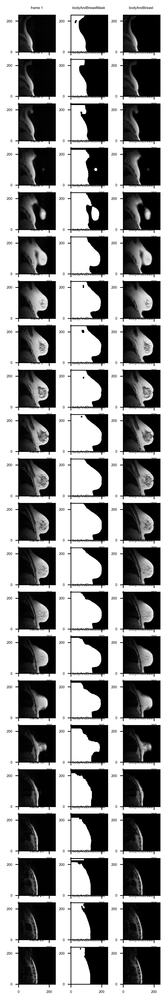

In [112]:
# First verify that bodyAndBreastMasks are sensible:

# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 3

for f in range(dimZ):
    frame = frames[:,:,f]
    
    bodyAndBreastMask = bodyAndBreastMasks[:,:,f]
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame);
    pyplot.title('frame ' + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask);
    pyplot.title('bodyAndBreastMask ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        
    bodyAndBreast = bodyAndBreastMask*frame
        
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreast);
    pyplot.title('bodyAndBreast ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

In [63]:
# Blur frames:
blurKernel = 3
blurKernel = 5 # this is decent (preserves breast in frame 4)
#blurKernel = 7 # too high (artifact in frame 4 above breast)

# Create empty 3D array for framesBlurred:
framesBlurred = np.zeros((dimY, dimX, dimZ), dtype='uint8')

for f in range(dimZ):
    frame = frames[:,:,f]
    
    frameBlurred = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0)

    framesBlurred[:,:,f] = frameBlurred

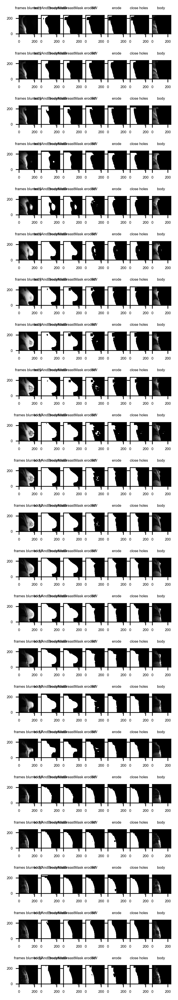

In [151]:
 """ 
 This is very difficult without either leaving out significant breast and/or
 leaving in significant body (ribs).
 
 I think I need to start by using bodyAndBreastsMasks to remove the background.
 Then select an appropriate threshold and use it to find all pixels < thresh
 that relate to the body and not the breast.
 It might be useful to threshold at a value that is a % of the ave pix value
 in the result of removing the background.
 
 Isolating the breast was difficult. This time blur the image first 
 (might help reduce holes due to dark blood vessels).
 """

""" It does seem to perform a bit better - see frame 4 - the breast is preserved """
    

# Try different thresholds for body, breast and background
# using ave pix value (avePixVal) in each frame or
# using ave pix value across all frames:
ave_all_frames = 0 # use ave on frame-by-frame basis
ave_all_frames = 1 # use ave across all frames 

#avePixVal = np.average(frames[:,:,:]) # this will be updated if ave_all_frames = 0
avePixVal = np.average(framesBlurred[:,:,:]) # this will be updated if ave_all_frames = 0

# Try different thresholds for body, breast and background
# using max pix value (maxPixVal) in each frame or
# using max pix value across all frames:
max_all_frames = 0 # use max on frame-by-frame basis
#max_all_frames = 1 # use max across all frames 
""" 
Since the pixel values of the body doesn't seem to change much from 
frame to frame, it might be sufficient to use a fixed threshold. 
It seems reasonable for the fixed threshold to be a % of the maxPixVal,
rather than the avePixVal.
"""

# Chose whether to use frames or framesBlurred:
use_blurred = 0 # use frames
use_blurred = 1 # use framesBlurred

# Get the max pixel value:
if use_blurred:
    maxPixVal = np.max(framesBlurred[:,:,:])
    frames_used = 'frames blurred ' # used for plot titles
else:
    maxPixVal = np.max(frames[:,:,:]) 
    frames_used = 'frames ' # used for plot titles

    
    
# Thresholds expressed as a % of avePixVal 
# for any given frame:
thresh_background = 0.0001 # = 0.01% <-- seems good for dataNorm
thresh_background = 0.5 # = 50%
thresh_background = 0.25 # = 25%
thresh_background = 0.35 # = 35%
thresh_background = 0.4 # = 40% of avePixVal <---- seems to be ideal for normal images
#thresh_background = 0.8 # = 80%
#thresh_background = 0.9 # = 90%
#thresh_background = 0.95 # = 95%
#thresh_background = 1.25 # = 125%
#thresh_background = 1.15 # = 115%
#thresh_background = 1.05 # = 105%
#thresh_background = 0.00001 # = 0.001%



# A threshold value of 40% of avePixVal was useful for isolating the body+breast from
# the background.  Now try to determine a suitable threshold value as a % of maxPixVal
# that isolates the breast from the body:
thresh_breast = 0.8 # = 80% of maxPixVal (too high)
thresh_breast = 0.7 # = 70% of maxPixVal (too high)
#thresh_breast = 0.5 # = 50% of maxPixVal (too high)
#thresh_breast = 0.25 # = 20% of maxPixVal (ok-ish when using maxPixVal for all frames)
thresh_breast = 0.6 # = 60% (seems suitable for non-blurred and blurred images)
#thresh_breast = 0.5 # not better than 0.6 for blurred images
#thresh_breast = 0.55 # not better than 0.6 for blurred images

# Select appropriate threshold for body as a % of maxPixVal:
thresh_body = 0.15 # = 15% of maxPixVal 
#thresh_body = 0.05 # = 5% of maxPixVal
#thresh_body = 0.1 # = 10% of maxPixVal
thresh_body = 0.3 # 30% of maxPixVal
thresh_body = 0.2 # 20% of maxPixVal <--- seems to be good
thresh_body = 0.25 # 25% of maxPixVal <-- 20% was better (but maybe 25% will be better after erosion?)
thresh_body = 0.5 # 50% of maxPixVal <-- better than ~20-25% with single maxPixVal
#thresh_body = 0.6 # 60% of maxPixVal <-- too high
#thresh_body = 0.55 # 55% of maxPixVal <-- too high
""" 
For some bizarre reason higher values for thresh_body (which result in higher values
of thresh) give a better result, i.e. more body is preserved!!

thresh_body = 0.25 is decent for max_all_frames = 1

"""

# Blur frames:
blurKernel = 3
blurKernel = 5 # this is decent (preserves breast in frame 4)
blurKernel = 7 # too high (artifact in frame 4 above breast)
blurKernel = 15 # too high (artifact in frame 4 above breast)

Kernel1 = np.ones((1,1),np.uint8) # used for dilate
Kernel2 = np.ones((2,2),np.uint8) # used for dilate
Kernel3 = np.ones((3,3),np.uint8) # used for dilate
Kernel5 = np.ones((5,5),np.uint8) # used for dilate
Kernel7 = np.ones((7,7),np.uint8) # used for closing holes
Kernel11 = np.ones((11,11),np.uint8) # used for closing holes
Kernel20 = np.ones((20,20),np.uint8) # used for closing holes
Kernel50 = np.ones((50,50),np.uint8) # used for closing holes


# Create empty 3D array for the bodyMasks for each frame:
bodyMasks = np.zeros((dimY, dimX, dimZ), dtype='bool')


# Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'4', 'color':'black', 'weight':'normal',
              'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'fontname':'Arial', 'size':'6'}

pyplot.figure(figsize=(3, 20), dpi=300)

i = 0 # for subplot pos

cols = 7

for f in range(dimZ):
    if use_blurred:
        #frame = framesBlurred[:,:,f]
        frame = cv2.GaussianBlur(frames[:,:,f], (blurKernel, blurKernel), 0)
        frame = cv2.GaussianBlur(frame, (blurKernel, blurKernel), 0) # blur again
    else:
        frame = frames[:,:,f]
    
    
    if not ave_all_frames:
        avePixVal = np.average(frame[:,:])
    
    if not max_all_frames:
        maxPixVal = np.max(frame[:,:])
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, frame); # note frame could be blurred!
    pyplot.title(frames_used + str(f+1), **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    # Use bodyAndBreastMasks:
    bodyAndBreastMask = bodyAndBreastMasks[:,:,f]
    
    i = i + 1    
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask); # note frame could be blurred!
    pyplot.title('bodyAndBreastMask', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
    
    # To help with isolating the body from breast, erode 
    # bodyAndBreastMask a little. But first need to convert to uint8:
    bodyAndBreastMask = np.uint8(bodyAndBreastMask)
    
    #bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 5) 
    bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 15)
    #bodyAndBreastMask = cv2.erode(bodyAndBreastMask, Kernel3, iterations = 20)
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, bodyAndBreastMask);
    pyplot.title('bodyAndBreastMask eroded', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
    
    
    
    """ First isolate the body using thresh_body: """
    
    # Convert to B&W using thresh:
    #thresh = avePixVal*thresh_background
    ##thresh = InvAvePixVal*thresh_background
    #thresh = maxPixVal*thresh_breast
    thresh = maxPixVal*thresh_body
    
    #print('thresh_background = ', str(thresh_background))
    #print('avePixVal = ', str(avePixVal))
    #print('thresh = ', str(thresh), '\n')

    
    # Create empty array for mask:
    mask = np.zeros((dimY, dimX), dtype='uint8')
    
    for r in range(dimY):
        for c in range(dimX):
            if frame[r,c] < thresh:
                mask[r,c] = 255
    
    
    # Use bodyAndBreastMasks to remove the background:
    #mask = mask*bodyAndBreastMasks[:,:,f]
    mask = mask*bodyAndBreastMask
    
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('BW ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Erode:
    #out = cv2.erode(out, Kernel3, iterations = 5) 
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel2, iterations = 7)
    #mask = cv2.erode(mask, Kernel2, iterations = 10)
    #mask = cv2.erode(mask, Kernel2, iterations = 15)
    #mask = cv2.erode(mask, Kernel2, iterations = 20) # seems ok
    #mask = cv2.erode(mask, Kernel2, iterations = 30)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    #mask = cv2.erode(mask, Kernel2, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 3)
    #mask = cv2.erode(mask, Kernel3, iterations = 10)
    #mask = cv2.erode(mask, Kernel3, iterations = 20)
    #mask = cv2.erode(mask, Kernel3, iterations = 15) # good compromise for un-blurred frames (max_all_frames = 0, thresh_breast = 0.6)
    #mask = cv2.erode(mask, Kernel3, iterations = 17)# seems fine using blurred frames (max_all_frames = 0, thresh_breast = 0.6)
    #mask = cv2.erode(mask, Kernel3, iterations = 5)
    mask = cv2.erode(mask, Kernel3, iterations = 10) # decent for thresh_body = 0.25 and max_all_frames = 1
    
    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('erode ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)

    
    
    # Close holes:
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
    #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
    #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel50) 

    i = i + 1
    ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
    pyplot.pcolormesh(x, y, mask);
    pyplot.title('close holes ', **title_font)

    # Set the tick labels font
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontsize(4)
        
        

      
    """ Dilation doesn't seem to be helpful this time and causing more problems """
    if 0:
        # Dilate:
        #out = cv2.dilate(out, Kernel3, iterations = 7) 
        #mask = cv2.dilate(mask, Kernel3, iterations = 3) 
        #mask = cv2.dilate(mask, Kernel3, iterations = 10)
        #mask = cv2.dilate(mask, Kernel2, iterations = 10)
        #mask = cv2.dilate(mask, Kernel3, iterations = 10)
        #mask = cv2.dilate(mask, Kernel5, iterations = 3)
        #mask = cv2.dilate(mask, Kernel3, iterations = 3)
        #mask = cv2.dilate(mask, Kernel3, iterations = 15)
        #mask = cv2.dilate(mask, Kernel3, iterations = 20) # ok for thresh_body = 0.2
        mask = cv2.dilate(mask, Kernel3, iterations = 25) # ok for thresh_body =

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('dilate ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
            
            
    if 0:
        # Close holes:
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel3) 
        #out = cv2.morphologyEx(out, cv2.MORPH_CLOSE, Kernel11) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel7) 
        #mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel11) 
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, Kernel20) 

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, mask);
        pyplot.title('close holes ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)
        
        

    if 1:
        # Convert mask to binary:
        bodyMask = cv2.threshold(mask, 255/2, 1, cv2.THRESH_BINARY)[1]

        # Background mask is the logical compliment of bodyAndBreastMask:
        #backgroundMask = np.logical_not(bodyAndBreastMask)

        # Store masks in 3D arrays:
        #breastMasks[:,:,f] = breastMask
        #backgroundMasks[:,:,f] = backgroundMask
        bodyMasks[:,:,f] = bodyMask

        # Show result of bodyMask:
        #breast = breastMask*frame
        body = bodyMask*frame

        i = i + 1
        ax = pyplot.subplot(dimZ,cols,i, aspect='equal')
        pyplot.pcolormesh(x, y, body);
        pyplot.title('body ', **title_font)

        # Set the tick labels font
        for label in (ax.get_xticklabels() + ax.get_yticklabels()):
            label.set_fontname('Arial')
            label.set_fontsize(4)


In [145]:
bodyAndBreastMask_uint8 = np.uint8(bodyAndBreastMask)

In [146]:
bodyAndBreastMask

array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False]])

In [147]:
bodyAndBreastMask_uint8

array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       ...,
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0],
       [1, 1, 1, ..., 0, 0, 0]], dtype=uint8)

In [123]:
maxPixVal

239

In [121]:
print('when thresh_body = ', str(thresh_body), ', thresh = ', str(thresh))

when thresh_body =  0.05 , thresh =  11.950000000000001


In [124]:
print('when thresh_body = ', str(thresh_body), ', thresh = ', str(thresh))

when thresh_body =  0.15 , thresh =  35.85
